## Control Variables
- ROBOT_RADIUS = 0.25
- RESOLUTION = 0.25
- BO_INITIAL_SAMPLES = 30
- BO_OPT_SAMPLES = 20
----
- Vary Num of Agent: 5/10/15
- Vary Objective Function
- Vary Scheme 
- Try another environment!!!
- Vary Region Size: 4/8/16 (maybe not)
- Vary Resolution: 0.1, 0.25, 0.5 (maybe not)

In [1]:
import BayesianOptimisation.boVoronoiDirected as boVoronoiDirected
import BayesianOptimisation.expGrid as expGrid
import BayesianOptimisation.expVoronoi as expVoronoi
import BayesianOptimisation.bo2VoronoiDirected as bo2VoronoiDirected
import BayesianOptimisation.experiment_setup as experiment
from core.DataStructure import *

from importlib import reload
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Rectangle
import copy
import time
import os
import itertools

from scipy.optimize import minimize, Bounds
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Reshape
from tensorflow.keras.utils import plot_model
from sklearn.model_selection import train_test_split

# Constant
np.random.seed(9)
NUM_SAMPLE = 50

### Helper Functions

In [2]:
COLOUR = itertools.cycle(['#00FFFF', '#6495ED', '#89CFF0', '#0000FF', '#7393B3', '#088F8F', 
                          '#0096FF', '#0047AB', '#00FFFF', '#00008B', '#6F8FAF',
                          '#1434A4', '#7DF9FF', '#6082B6', '#00A36C', '#5D3FD3',
                          '#ADD8E6'])

In [3]:
# Updated Get Coverage, take into account of obs now
def getCoverage(exp, G, directed = False, save_fig_path = None):
    total_area = 0
    total_dist = 0
    assigned = {}
    fig, ax = plt.subplots(figsize=(6,6))
    plt.xlim(0,34)
    plt.ylim(0,34)
    count = 0
    
    for o in exp.obstacles_loc:
        adjustedx, adjustedy = o[1],o[0]
        rect = Rectangle((adjustedx-0.5,adjustedy-0.5),1,1,linewidth=0.1,fill=True, angle = 0, color = 'black')
        plt.gca().add_patch(rect)
    im = fig
    im.canvas.draw()
    X = np.array(im.canvas.renderer._renderer)
    X_reshape = X.reshape((-1,4))
    X_reshape = np.delete(X_reshape, [1,2,3], axis = 1)
    obs_black = np.count_nonzero(X_reshape == 0)
#     print("Obstacle Black", obs_black)
    
    for n in G.nodes:
        for e in G.neighbors(n):
            if n != e and frozenset((n, e)) not in assigned.keys():
                
                p1 = G.nodes[n]['position']
                p2 = G.nodes[e]['position']
                
                if (directed):
                    d = G.edges[n,e,0]['distance']
                    c = G.edges[n,e,0]['capacity']*exp.ROBOT_RADIUS
                else:
                    d = G.edges[n,e]['distance']
                    c = G.edges[n,e]['capacity']*exp.ROBOT_RADIUS
                
                
                assigned[frozenset((n, e))] = 1

                adjustp1 = Point(p1.y, p1.x)
                adjustp2 = Point(p2.y, p2.x)

                refpt1 = adjustp1 if adjustp1.y <= adjustp2.y else adjustp2
                refpt2 = adjustp1 if adjustp1.y > adjustp2.y else adjustp2

                if refpt1.x >= refpt2.x:
                    theta_rot = np.pi - np.arctan(abs(refpt1.y - refpt2.y)/abs(refpt1.x - refpt2.x))
                else:
                    theta_rot = np.arctan(abs(refpt1.y - refpt2.y)/abs(refpt1.x - refpt2.x))

                if theta_rot >= np.pi/2:
                    theta = theta_rot - np.pi/2
                else:
                    theta = theta_rot + np.pi/2

                dy = -(c/2)*np.sin(theta)
                if refpt1.y == refpt2.y:
                    dx = 0
                    width = d
                    height = c
                    a = 0
                elif refpt1.x > refpt2.x:
                    dx = -(c/2)*np.cos(theta)
                    width = c
                    height = d
                    a = (theta) * 180 / np.pi
                elif refpt1.x == refpt2.x:
                    dx = -(c/2)
                    width = c
                    height = d
                    a = 0
                else:
                    dx = (c/2)*np.cos(np.pi - theta)
                    width = d
                    height = c
                    a = (theta_rot) * 180 / np.pi
                    
                print_colour = 'blue' if save_fig_path != None else 'black'
                rect = Rectangle((refpt1.x+dx,refpt1.y+dy),width,height,linewidth=0.1,fill=True, angle = a,color = print_colour )
                plt.gca().add_patch(rect)
                count +=1

    ax.axis('off')
    if save_fig_path != None:
        plt.savefig(save_fig_path)

    im = fig
    im.canvas.draw()
    X = np.array(im.canvas.renderer._renderer)
    X_reshape = X.reshape((-1,4))
    X_reshape = np.delete(X_reshape, [1,2,3], axis = 1)
    black = np.count_nonzero(X_reshape == 0)
    white= np.count_nonzero(X_reshape == 255)
#     print("Black px", black, "White px", white)
    percentage = (black-obs_black)/(white+black-obs_black)
#     print("U2", percentage)
    return percentage

In [4]:
def showGirdSolution(paths=None, exp=None, save_fig_path=None):
    fig, ax = plt.subplots(figsize=(12,12))
    img = np.array(1-exp.image)
    ax = sb.heatmap(img)
    colors = copy.deepcopy(COLOUR)

    for agent, path in enumerate(paths):
        colour = next(colors)
        for t, pos in enumerate(path):
            if t == 0:
                continue
            past_pos = np.array(list(path[t-1]))
            pos = np.array(list(pos))
            plt.plot([past_pos[1],pos[1]], [past_pos[0],pos[0]], alpha=0.9, color = colour, linewidth=2)
            
            if np.all(pos == exp.end_locations[agent]):
                break
                
    for p in exp.start_locations:
        plt.scatter(p[1], p[0], s=80, facecolors='none', edgecolors='r')
    for p in exp.end_locations:
        plt.scatter(p[1], p[0], s=80, facecolors='r', edgecolors='r')
    
    plt.gca().invert_yaxis()
    plt.savefig(save_fig_path)
    return fig

In [5]:
def showVorSolution(
    paths = None,
    graph = None, 
    exp = None, 
    save_fig_path = None):
    
    fig, ax = plt.subplots(figsize=(12,12))
    img = np.array(1-exp.image)
    ax = sb.heatmap(img)
    colors = copy.deepcopy(COLOUR)
    
    for agent, path in enumerate(paths):
        colour = next(colors)
        for t, n in enumerate(path):
            if t == 0:
                continue
            past_n = path[t-1]
            
            p2 = graph.nodes[n]['position']
            p1 = graph.nodes[past_n]['position']
            
            plt.plot([p1.y,p2.y], [p1.x, p2.x], alpha=0.9, color = colour, linewidth=2)
        if np.all(graph.nodes[n]['position'] == exp.end_locations[agent]):
            break

    for p in exp.start_nodes:
        plt.scatter(exp.nodes[p].y, exp.nodes[p].x, s=80, facecolors='none', edgecolors='r')
    for p in exp.end_nodes:
        plt.scatter(exp.nodes[p].y, exp.nodes[p].x, s=80, facecolors='r', edgecolors='r')

    
    plt.gca().invert_yaxis()
    plt.savefig(save_fig_path)
    return fig

In [6]:
def showVorDirSolution(
    result_graph, 
    paths,
    exp,
    save_fig_path = None):
    
    fig, ax = plt.subplots(figsize=(12,12))
    img = np.array(1-exp.image)
    ax = sb.heatmap(img)
    colors = copy.deepcopy(COLOUR)
    
    assigned = {}
    scaler = 0.2
    for elem in result_graph.edges:
        cur = result_graph.edges[elem[0], elem[1], 0]['probability']
        opposite = result_graph.edges[elem[1], elem[0], 0]['probability']
        if cur > opposite:
            p1 = result_graph.nodes[elem[0]]['position']
            arr1 = np.array([p1.x,p1.y])
            p2 = result_graph.nodes[elem[1]]['position']
            arr2 = np.array([p2.x,p2.y])
            direction = (arr2-arr1) / np.linalg.norm(arr2 - arr1)
            mag = np.linalg.norm(arr2 - arr1)*scaler
            dx, dy = mag*direction
        else:
            p1 = result_graph.nodes[elem[1]]['position']
            arr1 = np.array([p1.x,p1.y])
            p2 = result_graph.nodes[elem[0]]['position']
            arr2 = np.array([p2.x,p2.y])
            direction = (arr2-arr1) / np.linalg.norm(arr2 - arr1)
            mag = np.linalg.norm(arr2 - arr1)*scaler
            dx, dy = mag*direction

        # only draw arrow once
        if frozenset((p1.y, p1.x, dy, dx)) not in assigned.keys():
            head_width = 0.1 if mag < 0.2 else 0.35
            plt.plot([p1.y,p2.y], [p1.x, p2.x],color = "grey", linewidth=1)
            plt.arrow(p1.y, p1.x, dy, dx, head_width = head_width, alpha=0.9, color = "grey", linewidth=0.1)
            assigned[frozenset((p1.y, p1.x, dy, dx))] = 1
        
        
    for p in exp.start_nodes:
        plt.scatter(exp.nodes[p].y, exp.nodes[p].x, s=80, facecolors='none', edgecolors='r')
    for p in exp.end_nodes:
        plt.scatter(exp.nodes[p].y, exp.nodes[p].x, s=80, facecolors='r', edgecolors='r')

    plt.gca().invert_yaxis()
    plt.savefig(save_fig_path)

In [7]:
def showVorDirSolutionPath(
    result_graph, 
    paths, image, 
    nodes, 
    start_nodes, 
    end_nodes, 
    all_path = True, 
    path_num = 0,
    save_fig_path = None):
    
    image2 = 1-image
    fig, ax = plt.subplots(figsize=(12,12))
    img = np.array(1-image)
    ax = sb.heatmap(img)
    colors = copy.deepcopy(COLOUR)
    
    edges_in_path = []
    assigned = {}
    drawn = {}
    
    for index, path in enumerate(paths):
        colour = next(colors)
        for ite in range(len(path)-1):
            edges_in_path.append(np.array([path[ite],path[ite+1],0]))
            p1 = result_graph.nodes[path[ite]]['position']
            p2 = result_graph.nodes[path[ite+1]]['position']

            for r in (p1.x, p2.x, 1):
                for c in (p1.y, p2.y, 1):
                    if (Point(r,c) in np.array(nodes)[end_nodes]):
                        image2[int(r),int(c)] = 1
                    else:
                        image2[int(r),int(c)] += 0.2

        loop = result_graph.edges if all_path else edges_in_path

        for elem in loop:
            cur = result_graph.edges[elem[0], elem[1], 0]['probability']
            opposite = result_graph.edges[elem[1], elem[0], 0]['probability']
            unused = 1 - cur - opposite
            scaler = 0.8
            if cur > opposite:
                p1 = result_graph.nodes[elem[0]]['position']
                arr1 = np.array([p1.x,p1.y])
                p2 = result_graph.nodes[elem[1]]['position']
                arr2 = np.array([p2.x,p2.y])
                direction = (arr2-arr1) / np.linalg.norm(arr2 - arr1)
                mag = np.linalg.norm(arr2 - arr1)*scaler
                dx, dy = mag*direction
            else:
                p1 = result_graph.nodes[elem[1]]['position']
                arr1 = np.array([p1.x,p1.y])
                p2 = result_graph.nodes[elem[0]]['position']
                arr2 = np.array([p2.x,p2.y])
                direction = (arr2-arr1) / np.linalg.norm(arr2 - arr1)
                mag = np.linalg.norm(arr2 - arr1)*scaler
                dx, dy = mag*direction
            
            # only draw arrow once
            if frozenset((p1.y, p1.x, dy, dx)) not in assigned.keys() and frozenset([elem[0], elem[1]]) not in drawn:
                head_width = 0.1 if mag < 0.2 else 0.35
                plt.plot([p1.y,p2.y], [p1.x, p2.x],color = colour, linewidth=1)
                plt.arrow(p1.y, p1.x, dy, dx, head_width = head_width, alpha=0.9, color = colour, linewidth=0.1)
                assigned[frozenset((p1.y, p1.x, dy, dx))] = 1
                drawn[frozenset([elem[0], elem[1]])] = 1
        
    for p in exp.start_nodes:
        plt.scatter(exp.nodes[p].y, exp.nodes[p].x, s=80, facecolors='none', edgecolors='r')
    for p in exp.end_nodes:
        plt.scatter(exp.nodes[p].y, exp.nodes[p].x, s=80, facecolors='r', edgecolors='r')

    plt.gca().invert_yaxis()
    plt.savefig(save_fig_path)

In [8]:
def showVorDirSolutionAcc(
    result_graph, 
    paths, image, 
    nodes, 
    start_nodes, 
    end_nodes, 
    all_path = True, 
    path_num = 0,
    save_fig_path = None, 
    exp=None):
    
    image2 = 1-image
    fig, ax = plt.subplots(figsize=(12,12))
    img = np.array(1-exp.image)
    ax = sb.heatmap(img)
    colors = copy.deepcopy(COLOUR)
    
    edges_in_path = []
    assigned = {}
    drawn = {}
    
    for index, path in enumerate(paths):
        colour = next(colors)
        for ite in range(len(path)-1):
            edges_in_path.append(np.array([path[ite],path[ite+1],0]))
            p1 = result_graph.nodes[path[ite]]['position']
            p2 = result_graph.nodes[path[ite+1]]['position']

            for r in (p1.x, p2.x, 1):
                for c in (p1.y, p2.y, 1):
                    if (Point(r,c) in np.array(nodes)[end_nodes]):
                        image2[int(r),int(c)] = 1
                    else:
                        image2[int(r),int(c)] += 0.2

        loop = result_graph.edges if all_path else edges_in_path
        for elem in loop:
            cur = result_graph.edges[elem[0], elem[1], 0]['probability']
            opposite = result_graph.edges[elem[1], elem[0], 0]['probability']
            unused = 1 - cur - opposite
            scaler = 0.8
            if cur > opposite:
                p1 = result_graph.nodes[elem[0]]['position']
                arr1 = np.array([p1.x,p1.y])
                p2 = result_graph.nodes[elem[1]]['position']
                arr2 = np.array([p2.x,p2.y])
                direction = (arr2-arr1) / np.linalg.norm(arr2 - arr1)
                mag = np.linalg.norm(arr2 - arr1)*scaler
                dx, dy = mag*direction
            else:
                p1 = result_graph.nodes[elem[1]]['position']
                arr1 = np.array([p1.x,p1.y])
                p2 = result_graph.nodes[elem[0]]['position']
                arr2 = np.array([p2.x,p2.y])
                direction = (arr2-arr1) / np.linalg.norm(arr2 - arr1)
                mag = np.linalg.norm(arr2 - arr1)*scaler
                dx, dy = mag*direction
            
            # only draw arrow once
            if frozenset((p1.y, p1.x, dy, dx)) not in assigned.keys() and frozenset([elem[0], elem[1]]) not in drawn:
                head_width = 0.1 if mag < 0.2 else 0.35
                plt.plot([p1.y,p2.y], [p1.x, p2.x],color = colour, linewidth=1)
                plt.arrow(p1.y, p1.x, dy, dx, head_width = head_width, alpha=0.9, color = colour, linewidth=0.1)
                assigned[frozenset((p1.y, p1.x, dy, dx))] = 1
                drawn[frozenset([elem[0], elem[1]])] = 1
                
    #draw all other arrow
    scaler = 0.8
    for elem in result_graph.edges:
        cur = result_graph.edges[elem[0], elem[1], 0]['probability']
        opposite = result_graph.edges[elem[1], elem[0], 0]['probability']
        if cur > opposite:
            p1 = result_graph.nodes[elem[0]]['position']
            arr1 = np.array([p1.x,p1.y])
            p2 = result_graph.nodes[elem[1]]['position']
            arr2 = np.array([p2.x,p2.y])
            direction = (arr2-arr1) / np.linalg.norm(arr2 - arr1)
            mag = np.linalg.norm(arr2 - arr1)*scaler
            dx, dy = mag*direction
        else:
            p1 = result_graph.nodes[elem[1]]['position']
            arr1 = np.array([p1.x,p1.y])
            p2 = result_graph.nodes[elem[0]]['position']
            arr2 = np.array([p2.x,p2.y])
            direction = (arr2-arr1) / np.linalg.norm(arr2 - arr1)
            mag = np.linalg.norm(arr2 - arr1)*scaler
            dx, dy = mag*direction

        # only draw arrow once
        if frozenset((p1.y, p1.x, dy, dx)) not in assigned.keys() and frozenset([elem[0], elem[1]]) not in drawn:
            head_width = 0.1 if mag < 0.5 else 0.35
            plt.plot([p1.y,p2.y], [p1.x, p2.x],color = "grey", linewidth=1)
            plt.arrow(p1.y, p1.x, dy, dx, head_width = head_width, alpha=0.9, color = "grey", linewidth=0.1)
            assigned[frozenset((p1.y, p1.x, dy, dx))] = 1
            drawn[frozenset([elem[0], elem[1]])] = 1
        
    for p in exp.start_nodes:
        plt.scatter(exp.nodes[p].y, exp.nodes[p].x, s=120, facecolors='none', edgecolors='r')
    for p in exp.end_nodes:
        plt.scatter(exp.nodes[p].y, exp.nodes[p].x, s=120, facecolors='r', edgecolors='r')

    plt.gca().invert_yaxis()
    plt.savefig(save_fig_path)

In [ ]:
# Updated Get Coverage, take into account of obs now
def getECM(exp, G, directed = False, save_fig_path = None):
    total_area = 0
    total_dist = 0
    assigned = {}
    fig, ax = plt.subplots(figsize=(6,6))
    plt.xlim(0,34)
    plt.ylim(0,34)
    count = 0
    
    for o in exp.obstacles_loc:
        adjustedx, adjustedy = o[1],o[0]
        rect = Rectangle((adjustedx-0.5,adjustedy-0.5),1,1,linewidth=0.1,fill=True, angle = 0, color = 'black')
        plt.gca().add_patch(rect)
    im = fig
    im.canvas.draw()
    X = np.array(im.canvas.renderer._renderer)
    X_reshape = X.reshape((-1,4))
    X_reshape = np.delete(X_reshape, [1,2,3], axis = 1)
    obs_black = np.count_nonzero(X_reshape == 0)
#     print("Obstacle Black", obs_black)
    
    for n in G.nodes:
        for e in G.neighbors(n):
            if n != e and frozenset((n, e)) not in assigned.keys():
                
                p1 = G.nodes[n]['position']
                p2 = G.nodes[e]['position']
                
                if (directed):
                    d = G.edges[n,e,0]['distance']
                    c = G.edges[n,e,0]['capacity']*exp.ROBOT_RADIUS
                else:
                    d = G.edges[n,e]['distance']
                    c = G.edges[n,e]['capacity']*exp.ROBOT_RADIUS
                
                
                assigned[frozenset((n, e))] = 1

                adjustp1 = Point(p1.y, p1.x)
                adjustp2 = Point(p2.y, p2.x)

                refpt1 = adjustp1 if adjustp1.y <= adjustp2.y else adjustp2
                refpt2 = adjustp1 if adjustp1.y > adjustp2.y else adjustp2

                if refpt1.x >= refpt2.x:
                    theta_rot = np.pi - np.arctan(abs(refpt1.y - refpt2.y)/abs(refpt1.x - refpt2.x))
                else:
                    theta_rot = np.arctan(abs(refpt1.y - refpt2.y)/abs(refpt1.x - refpt2.x))

                if theta_rot >= np.pi/2:
                    theta = theta_rot - np.pi/2
                else:
                    theta = theta_rot + np.pi/2

                dy = -(c/2)*np.sin(theta)
                if refpt1.y == refpt2.y:
                    dx = 0
                    width = d
                    height = c
                    a = 0
                elif refpt1.x > refpt2.x:
                    dx = -(c/2)*np.cos(theta)
                    width = c
                    height = d
                    a = (theta) * 180 / np.pi
                elif refpt1.x == refpt2.x:
                    dx = -(c/2)
                    width = c
                    height = d
                    a = 0
                else:
                    dx = (c/2)*np.cos(np.pi - theta)
                    width = d
                    height = c
                    a = (theta_rot) * 180 / np.pi
                    
                print_colour = 'blue' if save_fig_path != None else 'black'
                rect = Rectangle((refpt1.x+dx,refpt1.y+dy),width,height,linewidth=0.1,fill=True, angle = a,color = print_colour )
                plt.gca().add_patch(rect)
                count +=1

    ax.axis('off')
    if save_fig_path != None:
        plt.savefig(save_fig_path)

    im = fig
    im.canvas.draw()
    X = np.array(im.canvas.renderer._renderer)
    X_reshape = X.reshape((-1,4))
    X_reshape = np.delete(X_reshape, [1,2,3], axis = 1)
    black = np.count_nonzero(X_reshape == 0)
    white= np.count_nonzero(X_reshape == 255)
#     print("Black px", black, "White px", white)
    percentage = (black-obs_black)/(white+black-obs_black)
#     print("U2", percentage)
    return percentage

In [9]:
results = []

### Experiment
- Vary number of agent
- Vary Objective
- Vary Dataset

Successfully created the directory ./data/Part2/12-agent/objective-Distance/Dataset1/ 
Set Hyper Parameters, solving for 12 agents
num acquisition: 1, time elapsed: 2.52s
num acquisition: 2, time elapsed: 5.74s
num acquisition: 3, time elapsed: 9.25s
num acquisition: 4, time elapsed: 12.44s
num acquisition: 5, time elapsed: 18.16s
num acquisition: 6, time elapsed: 20.31s
num acquisition: 7, time elapsed: 22.46s
num acquisition: 8, time elapsed: 25.29s
num acquisition: 9, time elapsed: 27.42s
num acquisition: 10, time elapsed: 29.64s
num acquisition: 11, time elapsed: 31.83s
num acquisition: 12, time elapsed: 38.55s
num acquisition: 13, time elapsed: 41.74s
num acquisition: 14, time elapsed: 44.62s
num acquisition: 15, time elapsed: 49.39s
num acquisition: 16, time elapsed: 51.80s
num acquisition: 17, time elapsed: 54.35s
num acquisition: 18, time elapsed: 56.63s
num acquisition: 19, time elapsed: 60.00s
num acquisition: 20, time elapsed: 62.21s
Successfully created the directory ./data

num acquisition: 9, time elapsed: 150.08s
num acquisition: 10, time elapsed: 264.13s
num acquisition: 11, time elapsed: 315.05s
num acquisition: 12, time elapsed: 323.52s
num acquisition: 13, time elapsed: 343.58s
num acquisition: 14, time elapsed: 357.90s
num acquisition: 15, time elapsed: 364.98s
num acquisition: 16, time elapsed: 420.69s
num acquisition: 17, time elapsed: 435.70s
num acquisition: 18, time elapsed: 528.28s
num acquisition: 19, time elapsed: 534.69s
num acquisition: 20, time elapsed: 547.85s
Successfully created the directory ./data/Part2/12-agent/objective-Distance/Dataset4/ 
Set Hyper Parameters, solving for 12 agents
num acquisition: 1, time elapsed: 0.97s
num acquisition: 2, time elapsed: 1.89s
num acquisition: 3, time elapsed: 2.81s
num acquisition: 4, time elapsed: 3.75s
num acquisition: 5, time elapsed: 5.39s
num acquisition: 6, time elapsed: 9.35s
num acquisition: 7, time elapsed: 10.31s
num acquisition: 8, time elapsed: 11.25s
num acquisition: 9, time elapsed

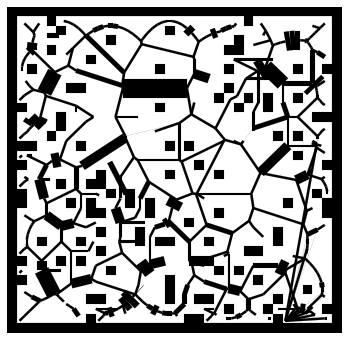

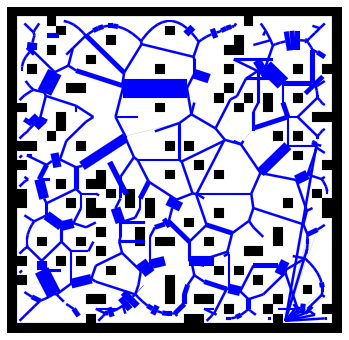

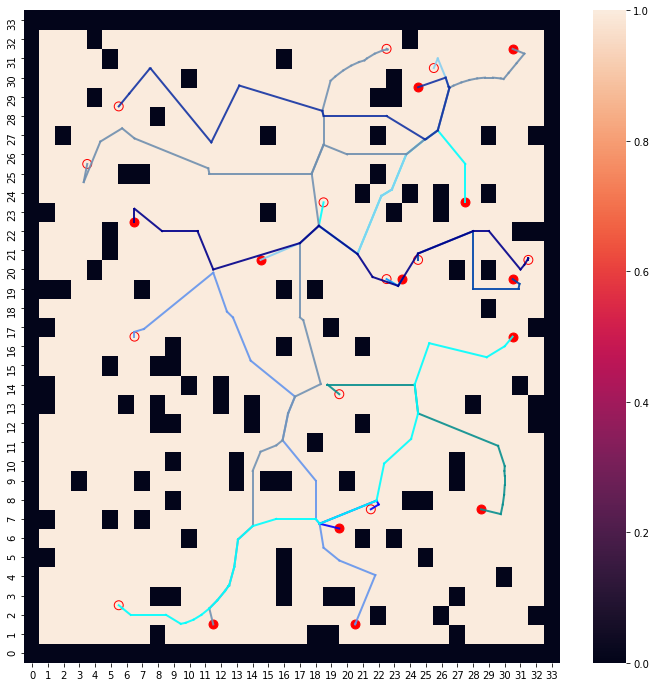

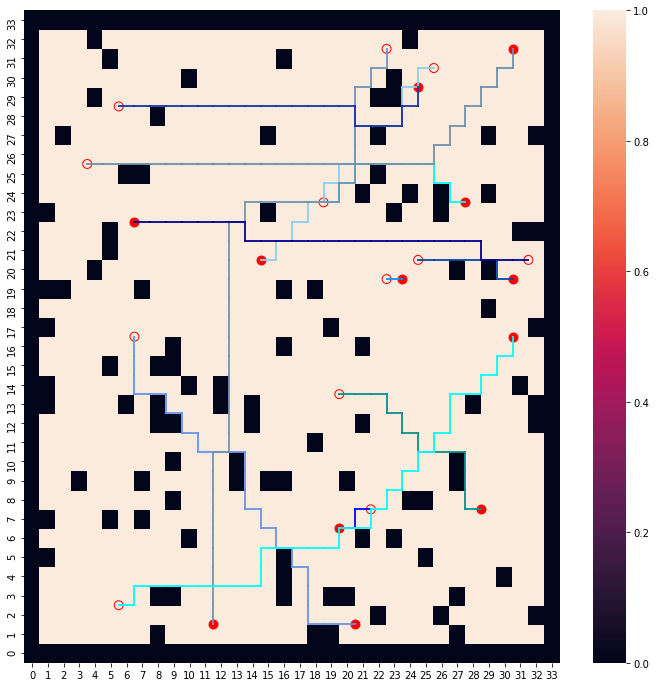

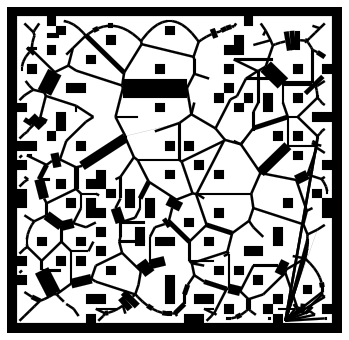

...

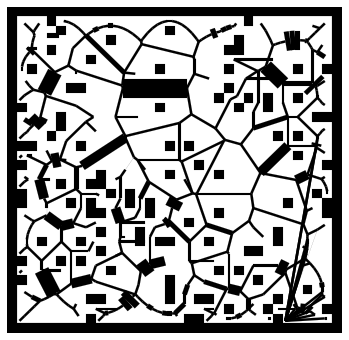

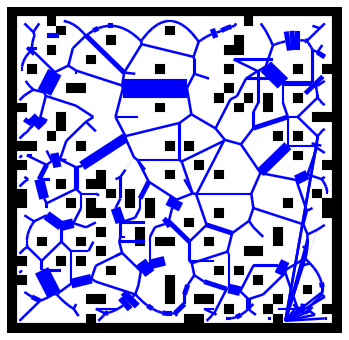

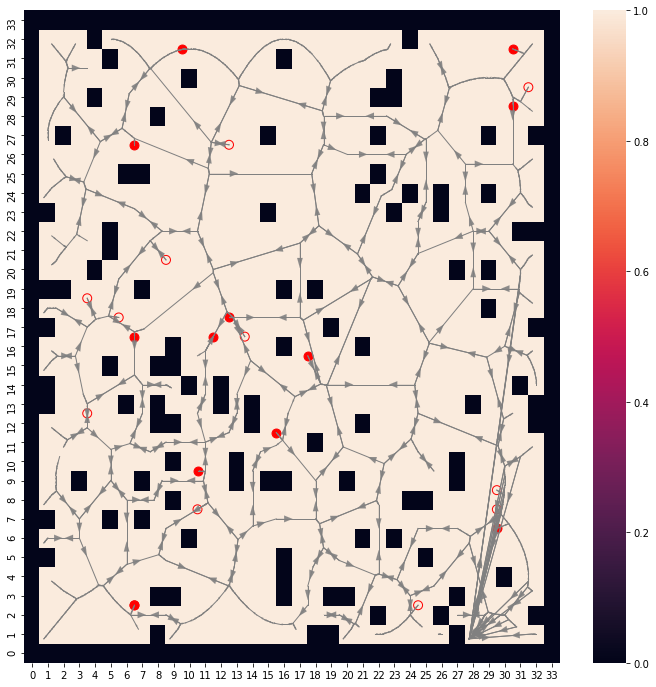

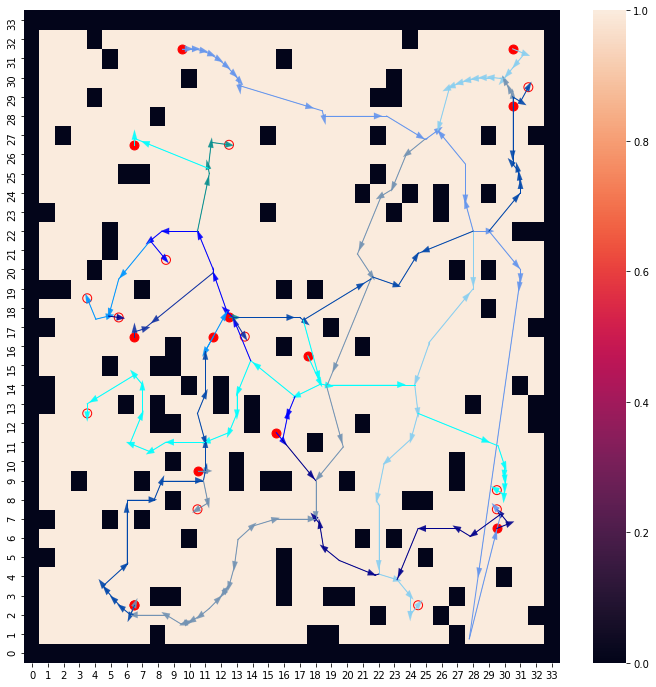

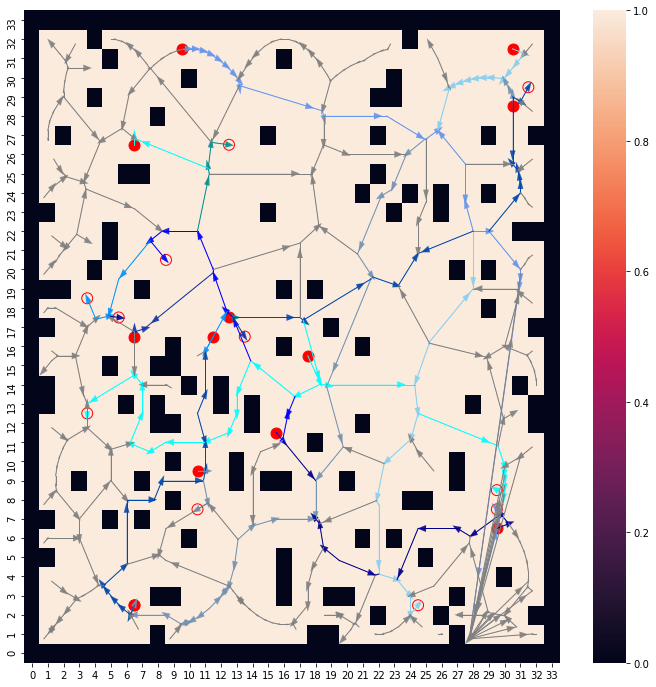

In [10]:
# num_agent_list = [2,4,8,12]
num_agent_list = [12]
objective_list = ["Distance","Capacity","Both"]
# objective_list = ["Capacity","Both"]

final_result_path = "./data/Part2/final_result.csv"
for NUM_AGENT in num_agent_list:
    for DATASET in range(1,6,1):
        for obj_idx, OBJECTIVE in enumerate(objective_list):
            try:
                overall_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/"
                os.makedirs(overall_path)
            except OSError:
                print ("Creation of the directory %s failed" % overall_path)
            else:
                print ("Successfully created the directory %s " % overall_path)

            grid_fig_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/grid.png"
            grid_path_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/grid.csv"
            vor_fig_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vor.png"
            vor_path_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vor.csv"
            vor_fig_coverage_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vor_coverage.png"
            vordir_fig_pathonly_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vordir_paths.png"
            vordir_fig_alledge_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vordir_alledge.png"
            vordir_fig_acc_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vordir_acc.png"
            vordir_fig_coverage_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vordir_coverage.png"
            vordir_path_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vordir_path.csv"
            vordir_probability_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vordir_prob.csv"
            # without sub graph
            vordir2_fig_pathonly_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vordir_nosub_paths.png"
            vordir2_fig_alledge_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vordir_nosub_alledge.png"
            vordir2_fig_acc_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vordir_nosub_acc.png"
            vordir2_fig_coverage_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vordir_nosub_coverage.png"
            vordir2_path_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vordir_nosub_path.csv"
            vordir2_probability_path = "./data/Part2/"+str(NUM_AGENT)+"-agent/objective-"+OBJECTIVE+"/Dataset"+str(DATASET)+"/vordir_nosub_prob.csv"
            
            
            
            scenemap = "./input/random-32-32-10/random-32-32-10.map"
            scene = "./input/random-32-32-10/scen-even/random-32-32-10-even-" + str(DATASET) + ".scen"
            exp = experiment.Experiment(scenemap=scenemap, scene=scene, objective= OBJECTIVE, num_agent=NUM_AGENT)
            
            # Voronoi
            vor_paths,vor_cost,vor_penality,vor_ft, vor_u1, vor_u2, vor_con, vor_conmax, vor_conavg, vor_G = expVoronoi.exp_voronoi(exp)
            assert exp.NUM_OF_AGENT == NUM_AGENT # raise error if cant find that many agent
            
            vor_u2 = getCoverage(exp,vor_G)
            getCoverage(exp,vor_G, save_fig_path=vor_fig_coverage_path) # save coverage plot
            _ = showVorSolution(
                paths=vor_paths, 
                graph=vor_G,
                exp=exp, 
                save_fig_path=vor_fig_path)
            with open(vor_path_path, 'a+') as f:
                paths = [[idx, exp.nodes[t].x , exp.nodes[t].y] for idx, path in enumerate(vor_paths) for t in path]
                paths_pd = pd.DataFrame(paths,columns=['Agent', 'X','Y'])
                pd.DataFrame(paths_pd).to_csv(f, index=None)
            
            # Grid
            if obj_idx == 0:
                grid_paths, grid_cost, grid_penality, grid_ft, grid_u1, grid_u2, grid_con, grid_conmax, grid_conavg = expGrid.exp_grid(exp)
            _ = showGirdSolution(paths = grid_paths, exp=exp, save_fig_path=grid_fig_path)
            
            with open(grid_path_path, 'a+') as f:
                paths = [[idx, t[0], t[1]] for idx, path in enumerate(grid_paths) for t in path]
                paths_pd = pd.DataFrame(paths,columns=['Agent', 'X','Y'])
                pd.DataFrame(paths_pd).to_csv(f, index=None)


            # Directed Voronoi
            # Optimiser
            opt, graph = bo2VoronoiDirected.bo2_voronoi_directed(exp, num_sample = NUM_SAMPLE)
            vordir_m = opt.x_opt[-3]
            vordir_c = opt.x_opt[-2]
            # Visualisation
            probabilities = opt.x_opt
            output = bo2VoronoiDirected.get_results(probabilities, exp)
            vordir_paths, vordir_cost, vordir_ft, vordir_u1, vordir_u2, vordir_con, vordir_conmax, vordir_conavg, vordir_G0, vordir_G, vordir_thres, vordir_penality = output
            
            with open(vordir_path_path, 'a+') as f:
                paths = [[idx, exp.nodes[t].x , exp.nodes[t].y] for idx, path in enumerate(vordir_paths) for t in path]
                paths_pd = pd.DataFrame(paths,columns=['Agent', 'X','Y'])
                pd.DataFrame(paths_pd).to_csv(f, index=None)
            with open(vordir_probability_path, 'a+') as f:
                pd.DataFrame(opt.x_opt).to_csv(f, index=None)
            
            vordir_u2 = getCoverage(exp,vordir_G, directed = True)
            getCoverage(exp,vordir_G, directed = True, save_fig_path=vordir_fig_coverage_path)
            showVorDirSolution(vordir_G, vordir_paths, exp, save_fig_path = vordir_fig_alledge_path)
            showVorDirSolutionPath(vordir_G, 
                                    vordir_paths, 
                                    exp.image, 
                                    exp.nodes, 
                                    exp.start_nodes, 
                                    exp.end_nodes, 
                                    all_path = False, 
                                    path_num = 0,
                                    save_fig_path = vordir_fig_pathonly_path) #path_num variables is unused
            showVorDirSolutionAcc(vordir_G, 
                                    vordir_paths, 
                                    exp.image, 
                                    exp.nodes, 
                                    exp.start_nodes, 
                                    exp.end_nodes, 
                                    all_path = False, 
                                    path_num = 0,
                                    save_fig_path = vordir_fig_acc_path, 
                                    exp=exp)
            
            
            # Voronoi Directed Without subgraph
            probabilities2 = copy.deepcopy(probabilities)
            probabilities2[-1] = 0
            output2 = bo2VoronoiDirected.get_results(probabilities2, exp)
            vordir2_paths, vordir2_cost, vordir2_ft, vordir2_u1, vordir2_u2, vordir2_con, vordir2_conmax, vordir2_conavg, vordir2_G0, vordir2_G, vordir2_thres, vordir2_penality = output
            vordir2_u2 = getCoverage(exp,vordir2_G0, directed = True)
            with open(vordir2_path_path, 'a+') as f:
                paths = [[idx, exp.nodes[t].x , exp.nodes[t].y] for idx, path in enumerate(vordir2_paths) for t in path]
                paths_pd = pd.DataFrame(paths,columns=['Agent', 'X','Y'])
                pd.DataFrame(paths_pd).to_csv(f, index=None)
            with open(vordir2_probability_path, 'a+') as f:
                pd.DataFrame(opt.x_opt).to_csv(f, index=None)
            getCoverage(exp,vordir2_G0, directed = True, save_fig_path=vordir2_fig_coverage_path)
            showVorDirSolution(vordir2_G0, vordir2_paths, exp, save_fig_path = vordir2_fig_alledge_path)
            showVorDirSolutionPath(vordir2_G0, 
                                    vordir2_paths, 
                                    exp.image, 
                                    exp.nodes, 
                                    exp.start_nodes, 
                                    exp.end_nodes, 
                                    all_path = False, 
                                    path_num = 0,
                                    save_fig_path = vordir2_fig_pathonly_path) #path_num variables is unused
            showVorDirSolutionAcc(vordir2_G0, 
                                    vordir2_paths, 
                                    exp.image, 
                                    exp.nodes, 
                                    exp.start_nodes, 
                                    exp.end_nodes, 
                                    all_path = False, 
                                    path_num = 0,
                                    save_fig_path = vordir2_fig_acc_path, 
                                    exp=exp)
            

            result = [NUM_AGENT, DATASET, OBJECTIVE, 
                      grid_ft, grid_u1, grid_conmax, grid_conavg, grid_penality,
                      vor_ft, vor_u1, vor_u2, vor_conmax, vor_conavg, vor_penality,
                      vordir_ft, vordir_u1, vordir_u2, vordir_penality,
                      vordir_conmax, vordir_conavg, vordir_thres, vordir_m, vordir_c,
                      vordir2_ft, vordir2_u1, vordir2_u2, vordir2_penality,
                      vordir2_conmax, vordir2_conavg,]

            # Saving results
            result_pd = pd.DataFrame([result],columns=['Agent', 'Dataset','Objective',
                                                        'grid_ft', 'grid_u1', 'grid_max', 'grid_avg', 'grid_penality',
                                                        'vor_ft', 'vor_u1', 'vor_u2', 'vor_max', 'vor_avg', 'vor_penality',
                                                        'vordir_ft', 'vordir_u1', 'vordir_u2', 'vordir_penality',
                                                        'vordir_max', 'vordir_avg', 'vordir_subgraph', 'vordir_m', 'vordir_c',
                                                        'vordir_ft_nosub', 'vordir_u1_nosub', 'vordir_u2_nosub', 'vordir_penality_nosub',
                                                        'vordir_max_nosub', 'vordir_avg_nosub'])
            
            with open(final_result_path, 'a+') as f:
                pd.DataFrame(result_pd).to_csv(f, index=None)

            results.append(result)
    

In [ ]:
df = pd.DataFrame(results,columns=['Agent', 'Dataset','Objective',
                                   'grid_ft', 'grid_u1', 'grid_max', 'grid_avg', 'grid_penality',
                                   'vor_ft', 'vor_u1', 'vor_u2', 'vor_max', 'vor_avg', 'vor_penality',
                                   'vordir_ft', 'vordir_u1', 'vordir_u2', 'vordir_penality',
                                   'vordir_max', 'vordir_avg', 'vordir_subgraph', 'vordir_m', 'vordir_c',
                                   'vordir_ft_nosub', 'vordir_u1_nosub', 'vordir_u2_nosub', 'vordir_penality_nosub',
                                   'vordir_max_nosub', 'vordir_avg_nosub'])